<div class="alert alert-info">
        
Инвесторы из фонда **«Shut Up and Take My Money»** решили попробовать себя в новой области и открыть заведение общественного питания в **Москве**. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
    
Для начала они просят нас подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
    
Нам доступен датасет с заведениями общественного питания **Москвы**, составленный на основе данных сервисов **Яндекс Карты** и **Яндекс Бизнес** на лето **2022** года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер. 

</div>

<div class="alert alert-success">
    
# Рынок заведений общественного питания Москвы
    
</div>    

## Загрузка данные и изучение общей информации

In [1]:
import pandas as pd # импортируем библиотеку pandas
import matplotlib.pyplot as plt # импортируем библиотеку matplotlib для будущих графиков 
import seaborn as sns # импортируем библиотеку seaborn 
import plotly.express as px # импортируем библиотеку plotly
from IPython.display import display # импортируем библиотеку display для вывода таблиц
from folium import Map, Choropleth # импортируем карту и хороплет
from folium import Map, Marker # импортируем карту и маркер
from folium.plugins import MarkerCluster # импортируем кластер
import json # подключаем модуль для работы с JSON-форматом
data = pd.read_csv('/datasets/moscow_places.csv') # создадим переменную по имени файла
display(data.head(5))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


<div class="alert alert-info">
    
Импортировали библиотеки `pandas`, `matplotlib.pyplot`, `seaborn`, `plotly` и `IPython.display`. Далее создадим переменную `data` и выведем первые **5** строк датафрейма. Данные распределены по **14** колонкам:
- `name` — *название заведения*
- `address` — *адрес заведения* 
- `category` — *категория заведения*
- `hours` — *информация о днях и часах работы*
- `lat` — *широта географической точки, в которой находится заведение*
- `lng` — *долгота географической точки, в которой находится заведение*
- `rating` — *рейтинг заведения по оценкам пользователей в Яндекс Картах*
- `price` — *категория цен в заведении*
- `avg_bill` — *строка, которая хранит среднюю стоимость заказа в виде диапазона*
- `middle_avg_bill` — *число с оценкой среднего чека,*
- `middle_coffee_cup` — *число с оценкой одной чашки капучино*
- `chain` — *идентификатор которое показывает, является ли заведение сетевым*
- `district` — *административный район, в котором находится заведение*
- `seats` — *количество посадочных мест*
    
</div>

In [2]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


<div class="alert alert-info">
    
Датафрейм содержит **8406** строк и **14** колонок. 
    
</div>

## Предобработка данных


### Проверка пропусков

In [3]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

<div class="alert alert-info">
    
Проверим на наличие пропусков. В колонке `hours` с указанием времени работы есть **536** пропусков, это около **6%** всех данных. В колонках `price` (**60%**), `avg_bill` (**54%**), `middle_avg_bill` (**62%**), `middle_coffee_cup` (**93%**), `seats` (**43%**) пропусковслишком много, поэтому оставим как есть.</div>    
    
</div>    

In [4]:
data['hours'].unique()

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

<div class="alert alert-info">
    
Проверим уникальные значения времени работы заведений.
    
</div>

In [5]:
data['hours'] = data['hours'].fillna('нет_данных')

<div class="alert alert-info">
    
Заменим пропуски в колонке `hours` на значение **нет данных**.
    
</div>

In [6]:
data[data['hours']=='нет_данных']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
38,Ижора,булочная,"Москва, Ижорский проезд, 5А",Северный административный округ,нет_данных,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN
40,Кафе,кафе,"Москва, Ижорская улица, 18, стр. 1",Северный административный округ,нет_данных,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN
44,Кафетерий,кафе,"Москва, Ангарская улица, 24А",Северный административный округ,нет_данных,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0
56,Рыба из тандыра,быстрое питание,"Москва, Коровинское шоссе, 46, стр. 5",Северный административный округ,нет_данных,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN
108,Кафе,"бар,паб","Москва, МКАД, 82-й километр, вл18",Северо-Восточный административный округ,нет_данных,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"Москва, Нагатинская набережная, 40/1к1",Южный административный округ,нет_данных,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN
8375,Улица Гурьянова 55,кафе,"Москва, улица Гурьянова, 55",Юго-Восточный административный округ,нет_данных,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN
8378,Восточно-грузинская кухня,быстрое питание,"Москва, Зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,нет_данных,55.710540,37.767864,4.3,NaN,NaN,NaN,NaN,0,120.0
8381,Аэлита,кафе,"Москва, Ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,нет_данных,55.708871,37.803831,3.8,NaN,NaN,NaN,NaN,0,30.0


<div class="alert alert-info">
    
Выведем колонку `hours` со значениями **нет данных**. Можем наблюдать, что данные отсутствуют у различных типов заведений, поэтому заменять на среднее значение будет не правильно.
    
</div>

### Проверка дубликатов

In [7]:
data.duplicated().sum()

0

<div class="alert alert-info">
    
Проверили датафрейм на наличие полных дубликатов. Дудликатов нет.
    
</div>

### Добавление колонки с указанием улицы

In [8]:
data['address'].nunique()

5753

<div class="alert alert-info">
    
В колонке с указанием адреса **5753** уникальных названия 
    
</div>

In [9]:
def streets (row):
    row = str(row) # преобразуем в строку
    streets = row.split(",") # разделяем по запятой
    return streets[1] # выводим второе значение строки
    
data['street'] = data['address'].apply(streets)
data['street'].head(10)

0               улица Дыбенко
1               улица Дыбенко
2          Клязьминская улица
3     улица Маршала Федоренко
4         Правобережная улица
5              Ижорская улица
6          Клязьминская улица
7          Клязьминская улица
8           Дмитровское шоссе
9             Ангарская улица
Name: street, dtype: object

<div class="alert alert-info">
    
Создадим новую колонку `street`, в нее войдут только название улицы. Для этого создадим функцию, которая  преобразуем адрес в строку с разделителем по **( , )** и выведем второе значение. Далее применим функцию к колонке `address`.
    
</div>

### Добавление колонки с круглосуточными заведениями

In [10]:
data['hours'].head(12)

0                                ежедневно, 10:00–22:00
1                                ежедневно, 10:00–22:00
2     пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...
3                                ежедневно, 09:00–22:00
4                                ежедневно, 10:00–22:00
5                                ежедневно, 10:00–23:00
6                     пн 15:00–04:00; вт-вс 15:00–05:00
7     пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...
8                                ежедневно, 10:00–22:00
9                                ежедневно, 12:00–00:00
10                             ежедневно, круглосуточно
11                               ежедневно, 10:00–21:00
Name: hours, dtype: object

<div class="alert alert-info">
    
Посмотрим еще раз на варианты графиков работы заведений. 
    
</div>

In [11]:
data['is_24/7'] = data['hours'] == 'ежедневно, круглосуточно'

<div class="alert alert-info">
    
Создадим новую колонку `is_24/7` в которой отразим заведения работающие **ежедневно и круглосуточно** и все остальные.
    
</div>

In [12]:
data['is_24/7'].head(12)

0     False
1     False
2     False
3     False
4     False
5     False
6     False
7     False
8     False
9     False
10     True
11    False
Name: is_24/7, dtype: bool

<div class="alert alert-info">
    
Колонка имеет **булев** тип данных.
    
</div>

### Добавление колонки с данными о цене на чашку капучино

In [13]:
def cap (row):
    try:
        if 'Цена чашки капучино' in row:
            return 'капучино'
    except:
        return 'нет данных'
data['cappuccino'] = data['avg_bill'].apply(cap)

<div class="alert alert-info">
    
В дальнейшем мы будем анализировать **кофейни**, поэтому добавим колонку с флагом на **чашку капучино**.
    
</div>

## Анализ данных

### Исследуем категории заведений представленых в данных.

In [14]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [15]:
data['category'].nunique()

8

<div class="alert alert-info">
    
Посмотрим на уникальные значения категорий представленных заведений. Их всего всего **8**. Странно, что отсутствуют ночные клубы и банкетные залы, а вот наличие булочной удивило.
    
</div>

In [16]:
data.groupby('category')['category'].count().sort_values(ascending= False)

category
кафе               2378
ресторан           2043
кофейня            1413
бар,паб             765
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

<div class="alert alert-info">
    
Сгруппируем данные по категориям и отсортируем по убыванию. Первое место занимает категория **Кафе**, далее с отставанием в **10%** расположились **Рестораны**, на третьем месте, набирающая в последние годы популярность, категория **Кафейня**. Категория **Бар,паб**, **Пиццерия** и **Быстрое питание** занимают середину списка со значениями порядка **30%** от лиделов. На последнем месте **Булочная** с показателями чуть выше **10%** от лидела.
    
</div>

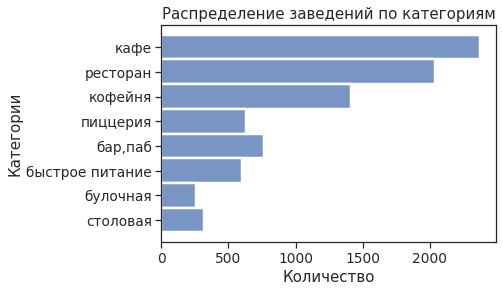

In [17]:
sns.set_style('whitegrid') 
sns.set_theme(style="ticks", font_scale=1.25)
sns.histplot(y='category', data=data)
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество')
plt.ylabel('Категории')
plt.show()

<div class="alert alert-info">
    
Построим график для наглядной визуализации. 
    
</div>

### Исследуем количество посадочных мест.

In [18]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

<div class="alert alert-info">
  
Исследуем данные по количеству посадочных мест, они предоставленны только по **4795** заведениям. Максимальное значение **1288** мест, среднее **108**, а медианное **75**. Это означает, что большое максимальное значение перетягивает среднее значение в большую сторону.
    
</div>

In [19]:
data[data['seats']== 1288].head(30)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,cappuccino
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0,проспект Вернадского,True,None
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0,проспект Вернадского,False,None
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False,нет данных
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False,нет данных
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0,проспект Вернадского,False,None
6684,Пивной ресторан,"бар,паб","Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,нет_данных,55.657133,37.481508,4.5,NaN,NaN,NaN,NaN,0,1288.0,проспект Вернадского,False,нет данных
6690,Японская кухня,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,нет_данных,55.657255,37.481547,4.4,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False,нет данных
6771,Точка,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,нет_данных,55.665634,37.477830,4.7,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,False,нет данных
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.665142,37.478603,3.6,NaN,NaN,NaN,NaN,0,1288.0,проспект Вернадского,False,нет данных
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",Западный административный округ,"ежедневно, круглосуточно",55.672580,37.507753,4.0,NaN,NaN,NaN,NaN,1,1288.0,проспект Вернадского,True,нет данных


<div class="alert alert-info">
    
Очень интересно, максимальное значение в **1288** мест указано в 11 заведениях. Примечательно, что заведения разных категорий,  есть как сетевые, так и не сетевые, но все располагаются на одной улице **проспакт Вернадского**.
    
</div>

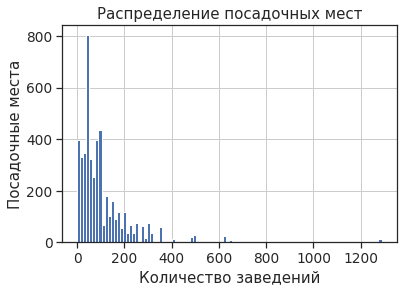

In [20]:
sns.set_style('whitegrid')
sns.set_theme(style="ticks", font_scale=1.25)
data['seats'].hist(bins=100)
plt.title('Распределение посадочных мест')
plt.xlabel('Количество заведений')
plt.ylabel('Посадочные места')
plt.show()

In [21]:
data[data['seats']>= 800].count()

name                 18
category             18
address              18
district             18
hours                18
lat                  18
lng                  18
rating               18
price                 5
avg_bill              5
middle_avg_bill       5
middle_coffee_cup     0
chain                18
seats                18
street               18
is_24/7              18
cappuccino           13
dtype: int64

<div class="alert alert-info">
    
Значения количества посадочных мест более **800** можно считать аномальными. 
    
</div>

In [22]:
seat = data.pivot_table(index= 'category', values= 'seats', aggfunc= 'median')
seat = seat.reset_index()
seat.sort_values(by='seats', ascending= False).style.background_gradient('coolwarm')

,category,seats
6,ресторан,86.000000
0,"бар,паб",82.500000
4,кофейня,80.000000
7,столовая,75.500000
2,быстрое питание,65.000000
3,кафе,60.000000
5,пиццерия,55.000000
1,булочная,50.000000


<div class="alert alert-info">
    
Посмотрим на медианное распределение по группам. Разница первого места от последнего **36** мест. На первом **рестораны**, далее **бар**, потом **кофейня** и **столовая**, **быстрое питание**, **кафе**, **пиццерия** и замыкает **булочная**. 
    
</div>

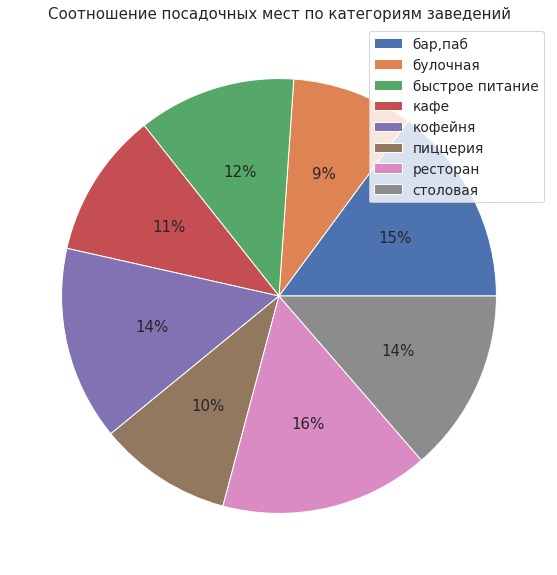

In [23]:
sns.set_theme(style="ticks", font_scale=1.25)
seat_pie = data.groupby('category')['seats'].agg('median')
seat_pie.plot(kind='pie', labels=None, label='', autopct='%1.0f%%',\
             legend=True, figsize=(10, 10), title='Соотношение посадочных мест по категориям заведений')
plt.show()

<div class="alert alert-info">
    
Построим круговую график распределения по **количеству посадочных мест** в зависимости от **категории** заведения. 
    
</div>

### Рассмотрим соотношение сетевых и несетевых заведений.

In [24]:
data.groupby('chain')['chain'].count()

chain
0    5201
1    3205
Name: chain, dtype: int64

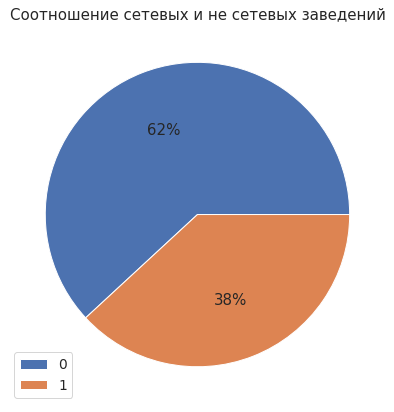

In [25]:
sns.set_theme(style="ticks", font_scale=1.25)
data_chain = data.groupby('chain')['chain'].agg('count')
data_chain.plot(kind='pie', labels=None, label='', autopct='%1.0f%%',\
             legend=True, figsize=(7, 7), title='Соотношение сетевых и не сетевых заведений')
plt.show()

<div class="alert alert-info">
    
Всего в датафрейме представлено **5201** заведений не сетевых и **3205** заведений сетевых. 
    Посмотрим на распределение, к сетевым отноястся **38%** представленных заведений. 
    
</div>

### Анализ категорий заведений которые чаще являются сетевыми? 

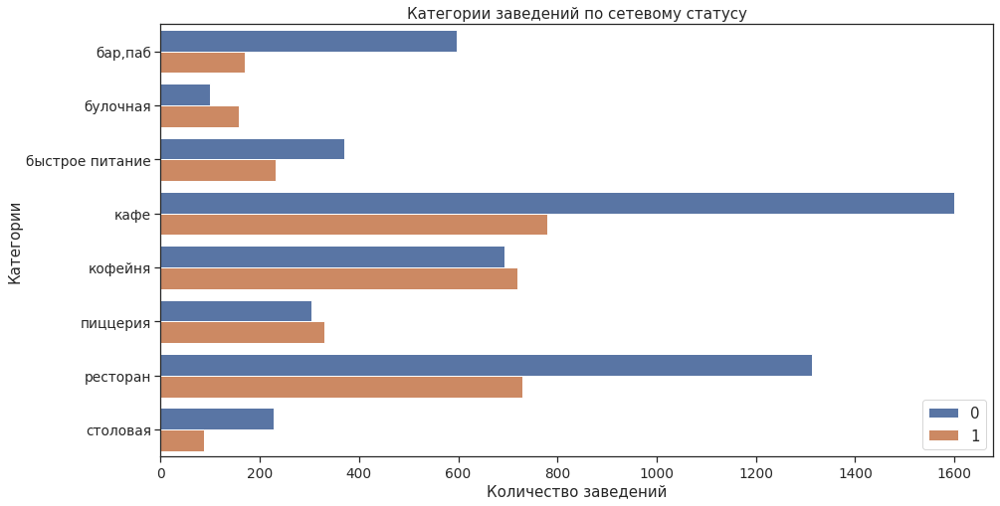

In [26]:
data_ed = data.groupby(['category', 'chain'], as_index = False)[['name']].count()
sns.set_style('white')
sns.set_theme(style="ticks", font_scale=1.25)
# назначаем размер графика
plt.figure(figsize=(15, 8))
# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=data_ed, hue='chain')
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Категории заведений по сетевому статусу')
plt.xlabel('Количество заведений')
plt.ylabel('Категории')
# выбираем положение легенды и указываем размер шрифта
plt.legend(loc='lower right', fontsize=15)
# добавляем сетку
#plt.grid()
# отображаем график на экране
plt.show()


<div class="alert alert-info">
    
Построим график распределения категорий в зависимости от сетевого статуса. По нему мы видим, что такие категории как: **кафе**, **ресторан**, **бар**, **быстрое питание** и **столовая** чаще не относятся к сетевым, а вот **кофейня**, **пиццерия** и **булочная** чаще имеют принадлежность к сетевому бизнесу. 
    
</div>

In [27]:
cat_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')
cat_chain.columns = [ 'chain_n', 'chain_y']
cat_chain = cat_chain.reset_index()
cat_chain['ratio'] = cat_chain['chain_y']/cat_chain['chain_n']
cat_chain.style.background_gradient('coolwarm')

,category,chain_n,chain_y,ratio
0,"бар,паб",596,169,0.283557
1,булочная,99,157,1.585859
2,быстрое питание,371,232,0.625337
3,кафе,1599,779,0.487179
4,кофейня,693,720,1.038961
5,пиццерия,303,330,1.089109
6,ресторан,1313,730,0.555979
7,столовая,227,88,0.387665


<div class="alert alert-info">
    
Посмотрим на данные в абсолютных цифрах. Сделаем сводную таблицу с указанием категории `category	`, количество не сетевых заведений `chain_n`, количество сетевых заведений `chain_y` и доля по отношению сетевых к не сетевым `ratio`. Например **булочная** имеет отношение **158%**, а **пиццерия** **108%**, **кофейня** **103%**, а **кафе** **48%** и **ресторан** **55%**.
    
</div>

### Анализ топ-15 популярных сетей в Москве. 

In [28]:
data_street = data.groupby(['street', 'name', 'category', 'district']).size().reset_index(name = 'count').sort_values(
    by = 'count', ascending = False)
data_street=data_street.sort_values(by = 'count', ascending = False)
data_street


,street,name,category,district,count
2980,МКАД,Кафе,кафе,Южный административный округ,4
4450,Рябиновая улица,Кафе,кафе,Западный административный округ,4
5590,Щёлковское шоссе,Кафе,кафе,Восточный административный округ,3
4236,Профсоюзная улица,Кафе,кафе,Юго-Западный административный округ,3
6181,проспект Мира,One Price Coffee,кофейня,Северо-Восточный административный округ,3
...,...,...,...,...,...
8191,улица Шаболовка,Crazy Noodle,быстрое питание,Южный административный округ,1
8192,улица Шаболовка,French Bakery,кафе,Южный административный округ,1
8193,улица Шаболовка,Meat Me,ресторан,Центральный административный округ,1
8194,улица Шаболовка,One price coffee,кофейня,Центральный административный округ,1


<div class="alert alert-info">
    
Создадим вспомогательную таблицу с данными по **улице**, **названию заведения**, **категории**, **округу**. Далее сгруппируем по названию в колонке `count`.
    
</div>

In [29]:
data_name_top = data_street.groupby(['name']).agg({'count':'sum'}).reset_index()
data_name_top.columns = ['name','sum']
data_name_top15 = data_name_top.sort_values(by = 'sum', ascending = False).head(15)
data_name_top15.style.background_gradient('coolwarm')

,name,sum
2890,Кафе,189
5522,Шоколадница,120
2584,Домино'с Пицца,76
2551,Додо Пицца,74
1156,One Price Coffee,71
5595,Яндекс Лавка,69
419,Cofix,65
1290,Prime,50
5083,Хинкальная,44
5421,Шаурма,43


<div class="alert alert-info">
    
Сгруппируем по названию и посчитаем количество таких заведений. Отсортируем по убыванию и выведем топ **15** заведений.
    На первом месте **Кафе** (над названием долго не думали) с **189** заведениями, на втором месте сеть **Шоколодница** c **120** заведениями, на третьем и четвертом месте расположились пиццерии **Домино'с Пицца** и **Додо Пицца** с **76** и **74** заведениями, а это на треть меньше заведений, чем у второго места. В **топ 15** вошли сети с более чем **34** заведениями. 
    
</div>

In [30]:
data_name_cat = data[['name', 'category']]
data_name_cat  

,name,category
0,WoWфли,кафе
1,Четыре комнаты,ресторан
2,Хазри,кафе
3,Dormouse Coffee Shop,кофейня
4,Иль Марко,пиццерия
...,...,...
8401,Суши Мания,кафе
8402,Миславнес,кафе
8403,Самовар,кафе
8404,Чайхана Sabr,кафе


<div class="alert alert-info">
    
Создадим переменную `data_name_cat` с названием и категориями.
    
</div>

In [31]:
data_top_name_cat = data_name_top15.merge(data_name_cat, on='name', how='left')
data_top_name_cat 

,name,sum,category
0,Кафе,189,кафе
1,Кафе,189,кафе
2,Кафе,189,"бар,паб"
3,Кафе,189,кафе
4,Кафе,189,кафе
...,...,...,...
986,Ресторан,34,ресторан
987,Ресторан,34,ресторан
988,Ресторан,34,ресторан
989,Ресторан,34,ресторан


<div class="alert alert-info">
    
Объединим две таблицы. Получим данные с названиями **топ 15** заведений и их категориями.
    
</div>

In [32]:
data_top_name_cat15 = data_top_name_cat.groupby(['name','category']).count()
data_top_name_cat15 = data_top_name_cat15.reset_index()
data_top_name_cat15.style.background_gradient('coolwarm')

,name,category,sum
0,Cofix,кофейня,65
1,One Price Coffee,кофейня,71
2,Prime,кафе,1
3,Prime,ресторан,49
4,Додо Пицца,пиццерия,74
5,Домино'с Пицца,пиццерия,76
6,КОФЕПОРТ,кофейня,42
7,Кафе,"бар,паб",2
8,Кафе,быстрое питание,7
9,Кафе,кафе,159


<div class="alert alert-info">
    
Группируем по названию. У **8** из **15** названий имеются заведения с разными категориями.
    
</div>

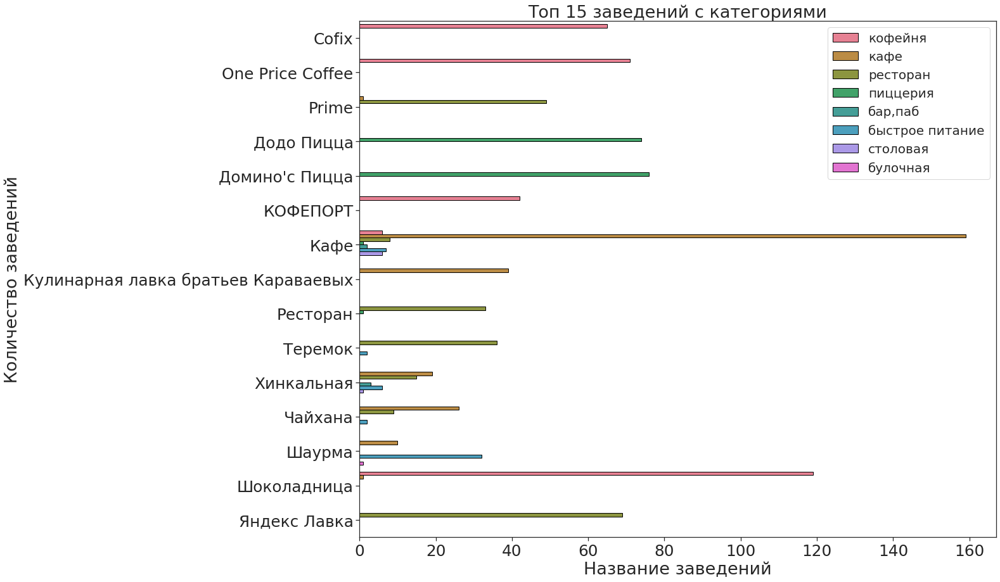

In [33]:
sns.set_style('whitegrid')
sns.set_theme(style="ticks", font_scale=2.25)
g = sns.barplot(data = data_top_name_cat15, x='sum', y='name', \
                palette='husl', ec='black', hue='category')
#plt.xticks(rotation = 45)
plt.legend(loc='upper right', fontsize=20)
g.set_title('Топ 15 заведений с категориями')
g.set_xlabel('Название заведений')
g.set_ylabel('Количество заведений')
g.figure.set_size_inches(18, 15)
plt.show()

<div class="alert alert-info">
    
Построим график для визуализации наших наблюдений. Видим, что **Кафе** представлено в **7** категориях, **Хинкальная** в **5**, **Чайхана** в **3**, **Шаурма** в **3**, **Шоколадница** в **2**.
    
</div>

### Анализ категорий заведений по административным округам.

In [34]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [35]:
data['district'].nunique()

9

<div class="alert alert-info">
    
Построим уникальные значения в колонке `district`. Всего **9** районов.
    
</div>

In [36]:
data_dist_cat = data.pivot_table(index='district', columns='category', values='name', aggfunc= 'count')
data_dist_cat = data_dist_cat.reset_index()
data_dist_cat.columns = ['district', 'бар,паб', 'булочная', 'быстрое питание', \
                         'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']

data_dist_cat.style.background_gradient('coolwarm')

,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


<div class="alert alert-info">
    
Сделаем сводную таблицу по **округам** и **категориям** и посчитаем количество заведений в каждой категории. Видим, что основная масса заведений располагается в **Центральном административном округе**, на него приходятся все первые места категорий при сортировки. Если не брать данные лидера, то видим, что **булочные** чаще располагаются в **Западном и Северном административном округах**, а **быстрое питание** развито в **Южном, Северо-Восточном и Восточном административном округе**. Распределение по остальным не так сильно выражено. 
    
</div>

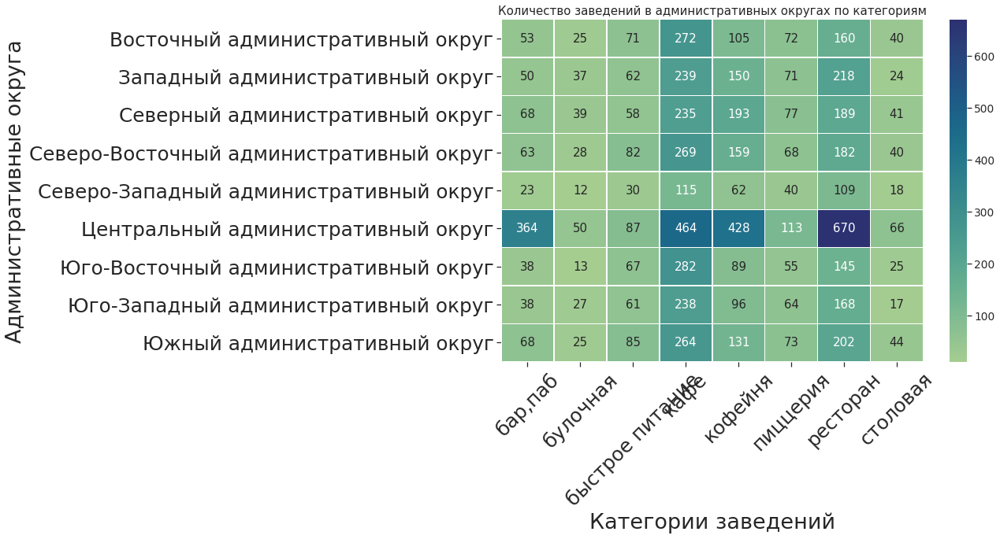

In [37]:
f, ax = plt.subplots(figsize=(12, 8))
sns.set_theme(style="ticks", font_scale=1.25)
sns.heatmap(data_dist_cat[['бар,паб', 'булочная', 'быстрое питание',\
                           'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']], \
            yticklabels=data_dist_cat['district'], annot=True, cmap="crest", linewidth=.5, fmt=".0f")
ax.set(xlabel="Категории заведений", ylabel="Административные округа")
ax.set_title('Количество заведений в административных округах по категориям')
plt.xticks(rotation = 45)
plt.show()

<div class="alert alert-info">
    
Построим тепловую карту для визуализации наших наблюдений. Пиковое значение в **670** заведений, показывают рестораны в **Центральном административном округе**
    
</div>

### Анализ распределений средних рейтингов по категориям заведений.

In [38]:
data['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

<div class="alert alert-info">
    
Построим на уникальные значения рейнига. Анамалий не наблюдаем. 
    
</div>

In [39]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

<div class="alert alert-info">
    
Посмотрим на значения в колонке `rating`. Посмотрим на распределение, среднее значение на уровне **4.22**, медианное значение **4.3**, первый перцентиль на уровне **4.1** (в основном ставят хорошие рейтинги).
    
</div>

In [40]:
cat_ratings = data.pivot_table(index='category', values='rating', aggfunc= {'count','mean'})
cat_ratings = cat_ratings.reset_index().sort_values(by = 'mean', ascending = False)
cat_ratings

,category,count,mean
0,"бар,паб",765,4.387712
5,пиццерия,633,4.301264
6,ресторан,2043,4.290357
4,кофейня,1413,4.277282
1,булочная,256,4.268359
7,столовая,315,4.211429
3,кафе,2378,4.123886
2,быстрое питание,603,4.050249


<div class="alert alert-info">
    
Построим сводную таблицу с указанием **категории и рейтинга** (*общего числа и среднего значения*). Отсортируем по убыванию. В зависимости от **категории**, среднее значение **рейтинга** изменяется не значительно (*в пределах десятых долей*).
    
</div>

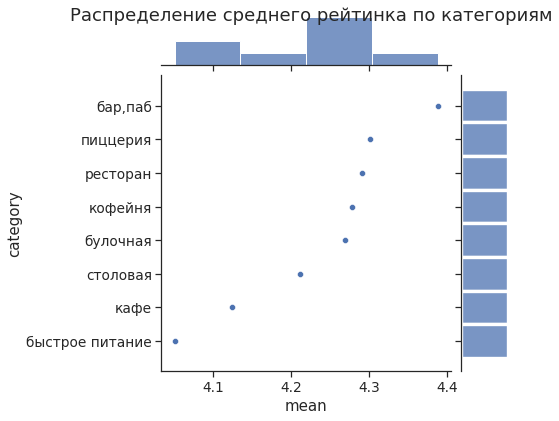

In [101]:
sns.set_style('whitegrid')
sns.set_theme(style="ticks", font_scale=1.25)
sns.jointplot(x='mean', y='category', data=cat_ratings)
plt.suptitle('Распределение среднего рейтинка по категориям')
plt.xlabel('Средний рейтинг')
plt.ylabel('Категория')
plt.show()

<div class="alert alert-info">
    
Визуализируем наши наблюдения. Самый высокий средний рейтинг у **баров**, далее идет группа из **4** категорий **(пиццерия, ресторан, кофейня и булочная)**, на удивление **столовая** опережает **кафе** и замыкает стисок **быстрое питание**.
    
</div>

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [42]:
dist_rating = data.pivot_table(index='district', values='rating', aggfunc={'count','mean'})
dist_rating = dist_rating.reset_index().sort_values(by = 'mean', ascending = False)
dist_rating.style.background_gradient('coolwarm')

,district,count,mean
5,Центральный административный округ,2242,4.377520
2,Северный административный округ,900,4.239778
4,Северо-Западный административный округ,409,4.208802
8,Южный административный округ,892,4.184417
1,Западный административный округ,851,4.181551
0,Восточный административный округ,798,4.174185
7,Юго-Западный административный округ,709,4.172920
3,Северо-Восточный административный округ,891,4.148260
6,Юго-Восточный административный округ,714,4.101120


<div class="alert alert-info">
    
Составим сводную таблицу по **округам** и посчитаем **средний рейтинг** по заведениям. Отсортируем по убыванию. Видим, что в **Центральном административном районе**, не только **самое большое количество заведений (2242)**, но еще и **самые высокие рейтинги (4.37)**.
    
</div>

In [43]:
# подключаем модуль для работы с JSON-форматом
import json

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:geo_json = json.load(f)
print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [44]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_rating,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

<div class="alert alert-info">
    
Создаем карту хороплет со значением среднего рейтинга по заведениям. Видим как явно выделяется **Центральный административный округ**, далее **Северный и Северо-Западный административные округа**, хуже всего обстоят дела в **Юго-Восточном административном округе**.  
    
</div>

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [45]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-info">
    
С помощью инструментов **folium** отображаем все заведения датафрейма на карте в виде кластеров. Видим как группируются заведения в центре Москвы. 
    
</div>

### Анализ топ-15 улиц по количеству заведений.

In [46]:
data_street

,street,name,category,district,count
2980,МКАД,Кафе,кафе,Южный административный округ,4
4450,Рябиновая улица,Кафе,кафе,Западный административный округ,4
5590,Щёлковское шоссе,Кафе,кафе,Восточный административный округ,3
4236,Профсоюзная улица,Кафе,кафе,Юго-Западный административный округ,3
6181,проспект Мира,One Price Coffee,кофейня,Северо-Восточный административный округ,3
...,...,...,...,...,...
8191,улица Шаболовка,Crazy Noodle,быстрое питание,Южный административный округ,1
8192,улица Шаболовка,French Bakery,кафе,Южный административный округ,1
8193,улица Шаболовка,Meat Me,ресторан,Центральный административный округ,1
8194,улица Шаболовка,One price coffee,кофейня,Центральный административный округ,1


<div class="alert alert-info">
    
Воспользуемся нашей вспомогательной таблицей.
    
</div>

In [47]:
data_st_top = data_street.groupby(['street']).agg({'count':'sum'}).reset_index()
data_st_top.columns = ['street','sum']
data_st_top15 = data_st_top.sort_values(by = 'sum', ascending = False).head(15)
data_st_top15.style.background_gradient('coolwarm')

,street,sum
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


<div class="alert alert-info">
    
Сгруппируем по колонке `street`, отсортируем по убыванию и сохраним первые **15** улиц. На первом месте **проспект Мира** с **184** заведениями, на втором месте **Профсоюзная улица** с **122** заведениями, далее **проспект Вернадского** на котором **108** заведений и на четвертом месте **Ленинский проспект** с **107** заведениями. Остальных улицах располагаются **менее 100** заведений.  
    Из открытых источников мы знаем, что протяженность **проспекта Мира** составляет **9 км**, таким образом можно посчитать **плотность** заведений, она составит **1 заведение на каждые 50 метров проспекта**. 
</div>

In [48]:
data_street_cat = data[['street', 'category']]
data_street_cat 

,street,category
0,улица Дыбенко,кафе
1,улица Дыбенко,ресторан
2,Клязьминская улица,кафе
3,улица Маршала Федоренко,кофейня
4,Правобережная улица,пиццерия
...,...,...
8401,Профсоюзная улица,кафе
8402,Пролетарский проспект,кафе
8403,Люблинская улица,кафе
8404,Люблинская улица,кафе


<div class="alert alert-info">
    
Выведем отдельно данные по **улицам** и **категориям** заведений.
    
</div>

In [49]:
data_top_street_cat = data_st_top15.merge(data_street_cat, on='street', how='left')
data_top_street_cat

,street,sum,category
0,проспект Мира,184,ресторан
1,проспект Мира,184,кафе
2,проспект Мира,184,кафе
3,проспект Мира,184,быстрое питание
4,проспект Мира,184,кафе
...,...,...,...
1253,Пятницкая улица,48,кофейня
1254,Пятницкая улица,48,кофейня
1255,Пятницкая улица,48,булочная
1256,Пятницкая улица,48,кофейня


<div class="alert alert-info">
    
Теперь можно объединить эти две таблицы.
    
</div>

In [50]:
data_top_street_cat15 = data_top_street_cat.groupby(['street','category']).count()
data_top_street_cat15 = data_top_street_cat15.reset_index()
data_top_street_cat15

,street,category,sum
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


<div class="alert alert-info">
    
Группируем полученную таблицу по значению.
    
</div>

In [51]:
data_top_street_cat15_piv = data_top_street_cat15.pivot_table(index='street', columns='category', values='sum', aggfunc= 'sum')
data_top_street_cat15_piv = data_top_street_cat15_piv.reset_index()
data_top_street_cat15_piv.columns = ['street', 'бар,паб', 'булочная', 'быстрое питание', \
                         'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
data_top_street_cat15_piv.style.background_gradient('coolwarm')

,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Варшавское шоссе,6.000000,nan,7.000000,18.000000,14.000000,4.000000,20.000000,7.000000
1,Дмитровское шоссе,6.000000,2.000000,10.000000,23.000000,11.000000,8.000000,24.000000,4.000000
2,Каширское шоссе,2.000000,nan,10.000000,20.000000,16.000000,5.000000,19.000000,5.000000
3,Кутузовский проспект,2.000000,1.000000,2.000000,14.000000,13.000000,3.000000,16.000000,3.000000
4,Ленинградский проспект,15.000000,4.000000,2.000000,12.000000,25.000000,9.000000,25.000000,3.000000
5,Ленинградское шоссе,5.000000,2.000000,5.000000,13.000000,13.000000,3.000000,26.000000,3.000000
6,Ленинский проспект,10.000000,3.000000,2.000000,26.000000,23.000000,5.000000,33.000000,5.000000
7,Люблинская улица,5.000000,nan,5.000000,26.000000,11.000000,1.000000,10.000000,2.000000
8,МКАД,1.000000,nan,9.000000,45.000000,4.000000,nan,5.000000,1.000000
9,Профсоюзная улица,6.000000,4.000000,15.000000,35.000000,18.000000,15.000000,26.000000,3.000000


<div class="alert alert-info">
    
Группируем данные по **улице** и сортируем по **категориям**, далее считаем количество заведений.
    
</div>

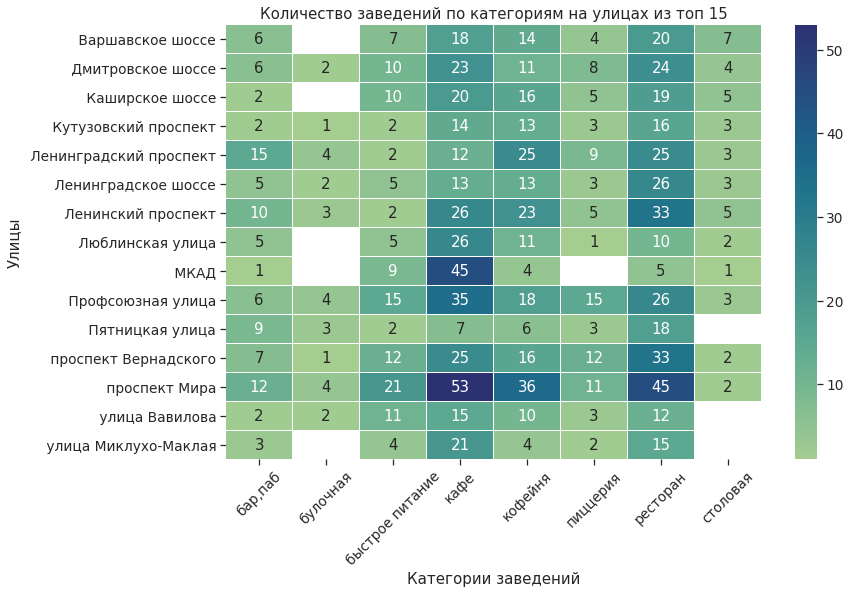

In [52]:
f, ax = plt.subplots(figsize=(12, 8))
sns.set_theme(style="ticks", font_scale=1.25)
sns.heatmap(data_top_street_cat15_piv[['бар,паб', 'булочная', 'быстрое питание',\
                           'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']], \
            yticklabels=data_top_street_cat15_piv['street'], annot=True, cmap="crest", linewidth=.5, fmt=".0f")
ax.set(xlabel="Категории заведений", ylabel="Улицы")
ax.set_title('Количество заведений по категориям на улицах из топ 15')
plt.xticks(rotation = 45)
plt.show()

<div class="alert alert-info">
    
Составляем тепловую карту с указанием улиц и категорий заведений которые там размещены. Лидеру заметны сразу.
    
</div>

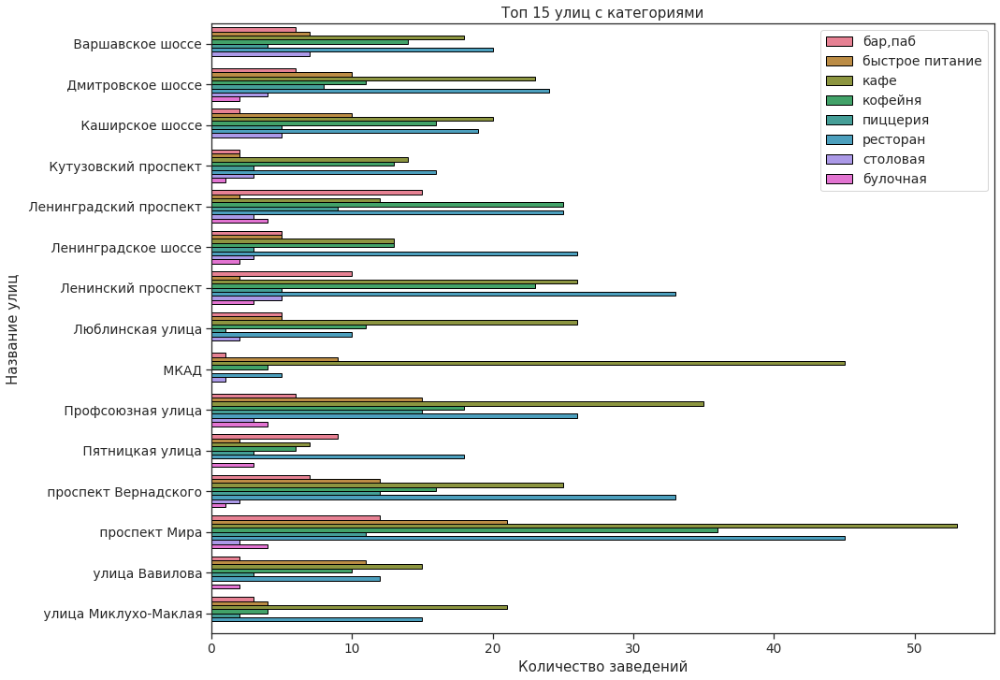

In [53]:
sns.set_style('whitegrid')
sns.set_theme(style="ticks", font_scale=1.25)
g = sns.barplot(data = data_top_street_cat15, x='sum', y='street', palette='husl', ec='black', hue='category')
#plt.xticks(rotation = 45)
plt.legend(loc='upper right', fontsize=14)
g.set_title('Топ 15 улиц с категориями')
g.set_xlabel('Количество заведений')
g.set_ylabel('Название улиц')
g.figure.set_size_inches(15, 12)
plt.show()

<div class="alert alert-info">
    
Выводим график для наглядной визуализации. 
    
</div>

### Анализ улиц на которых находится только один объект общепита. 

In [54]:
data_st_antitop = data_st_top.sort_values(by = 'sum', ascending = True)
data_st_antitop

,street,sum
0,1-й Автозаводский проезд,1
683,Одинцовская улица,1
689,Октябрьский переулок,1
694,Ордынский тупик,1
695,Оренбургская улица,1
...,...,...
523,Ленинградский проспект,95
525,Ленинский проспект,107
1087,проспект Вернадского,108
773,Профсоюзная улица,122


<div class="alert alert-info">
    
Воспользуемся нашей переменной `data_st_top` и сортируем ее по возростанию. Таким образом получаем название улиц с **наименьшим** количеством заведений.
    
</div>

In [55]:
data_antitop_st_cat = data_st_antitop.merge(data_street_cat, on='street', how='left')
data_antitop_st_cat = data_antitop_st_cat[data_antitop_st_cat['sum'] == 1]
data_antitop_st_cat

,street,sum,category
0,1-й Автозаводский проезд,1,кафе
1,Одинцовская улица,1,столовая
2,Октябрьский переулок,1,ресторан
3,Ордынский тупик,1,кофейня
4,Оренбургская улица,1,кафе
...,...,...,...
453,3-й Хорошёвский проезд,1,столовая
454,Бобров переулок,1,кафе
455,Богословский переулок,1,кофейня
456,4-й Лесной переулок,1,ресторан


<div class="alert alert-info">
    
Далее присоединяем таблицу с указанием категорий и выводим список улиц на которых размещено всего **одно** заведение.
    Таких улиц **458**.
    
</div>

In [56]:
data_street_baza = data[['street', 'name', 'district', 'lat', 'lng', 'rating']]
data_street_baza

,street,name,district,lat,lng,rating
0,улица Дыбенко,WoWфли,Северный административный округ,55.878494,37.478860,5.0
1,улица Дыбенко,Четыре комнаты,Северный административный округ,55.875801,37.484479,4.5
2,Клязьминская улица,Хазри,Северный административный округ,55.889146,37.525901,4.6
3,улица Маршала Федоренко,Dormouse Coffee Shop,Северный административный округ,55.881608,37.488860,5.0
4,Правобережная улица,Иль Марко,Северный административный округ,55.881166,37.449357,5.0
...,...,...,...,...,...,...
8401,Профсоюзная улица,Суши Мания,Юго-Западный административный округ,55.670021,37.552480,4.4
8402,Пролетарский проспект,Миславнес,Южный административный округ,55.640875,37.656553,4.8
8403,Люблинская улица,Самовар,Юго-Восточный административный округ,55.648859,37.743219,3.9
8404,Люблинская улица,Чайхана Sabr,Юго-Восточный административный округ,55.648849,37.743222,4.2


<div class="alert alert-info">
    
Подготовим данные для объединения с нашей таблицей `data_antitop_st_cat`.
    
</div>

In [57]:
anti_top = data_antitop_st_cat.merge(data_street_baza, on='street', how='left')
anti_top

,street,sum,category,name,district,lat,lng,rating
0,1-й Автозаводский проезд,1,кафе,Чайхана Азия,Южный административный округ,55.704847,37.657065,4.2
1,Одинцовская улица,1,столовая,Монастырская трапеза,Северо-Западный административный округ,55.790620,37.405720,4.5
2,Октябрьский переулок,1,ресторан,Кампа,Северо-Восточный административный округ,55.787258,37.612063,4.1
3,Ордынский тупик,1,кофейня,ABC Coffee Roasters,Центральный административный округ,55.741026,37.623384,4.5
4,Оренбургская улица,1,кафе,Шаурамус,Восточный административный округ,55.712535,37.862657,3.0
...,...,...,...,...,...,...,...,...
453,3-й Хорошёвский проезд,1,столовая,Галерея вкуса,Северный административный округ,55.773553,37.535854,4.2
454,Бобров переулок,1,кафе,Ex: Libris,Центральный административный округ,55.764983,37.634254,4.4
455,Богословский переулок,1,кофейня,Циники,Центральный административный округ,55.762591,37.599530,4.6
456,4-й Лесной переулок,1,ресторан,Prime,Центральный административный округ,55.778956,37.587358,4.2


<div class="alert alert-info">
    
Объединим две таблицы и получим список улиц на которых расположено всего **одно** заведение, а так же есть данные по **географической привязке (широта и долгота)**. Благодаря этому мы можем отметить эти заведения на карте. 
    
</div>

In [58]:
def streets_cl (row):
    row = str(row) # преобразуем в строку
    streets = row.split(" ") # разделяем по пробелу
    return streets[-1] # выводим последнее значение строки
    
anti_top['street_clacc'] = anti_top['street'].apply(streets_cl)
anti_top['street_clacc'].head(10)

0      проезд
1       улица
2    переулок
3       тупик
4       улица
5    переулок
6       улица
7       улица
8       тупик
9      проезд
Name: street_clacc, dtype: object

<div class="alert alert-info">
    
Сделаем функцию, которая обработает название улиц и выведет последнее слово **(тип улицы)**.
    
</div>

In [59]:
anti_top.pivot = anti_top.pivot_table(index='street_clacc', values='name', aggfunc='count')
anti_top.pivot = anti_top.pivot.reset_index()
anti_top.pivot.sort_values(by = 'name', ascending = False).head(10)

,street_clacc,name
155,улица,108
144,переулок,107
146,проезд,48
139,набережная,8
154,тупик,7
157,шоссе,5
145,площадь,5
143,парк,3
137,линия,3
142,отдыха,3


<div class="alert alert-info">
    
Применим нашу функцию к колонке `street`, получили типы улиц. Сгруппируем типы и отсортируем по убыванию. Видим, что на втором месте расположились **переулки**, а на третьем **проезды**. Косвенно это объесняет почему на этих улицах всего по одному заведению, улицы не большие.
    
</div>

In [60]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
anti_top.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-info">
    
По карте можем видеть, что заведения располагаются в разных районах, **категории** заведений тоже разные, но улицы в основном не большие, **переулки** и **проезды**.
    
</div>

In [61]:
pivot_st_cat = data_antitop_st_cat.pivot_table(index='category', values='street', aggfunc='count')
pivot_st_cat = pivot_st_cat.reset_index().sort_values(by = 'street', ascending = False)
pivot_st_cat.style.background_gradient('coolwarm')

,category,street
3,кафе,160
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


<div class="alert alert-info">
    
Группируем нашу таблицу по **категориям** и сортируем по убыванию. Получаем заначение в уличном антирейтинге, например на таких улицах, чаще всего располагается **кафе**, а **булочные** в меньшей степени.
    
</div>

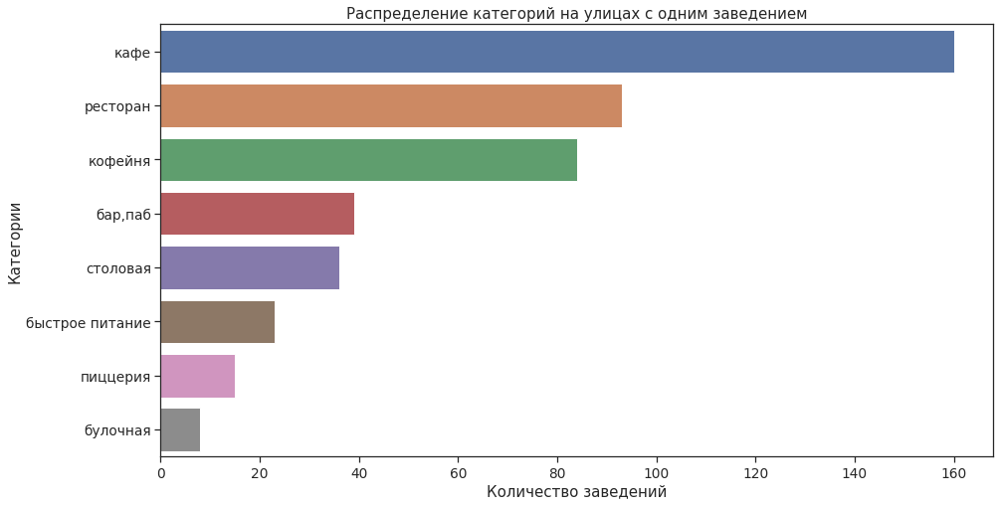

In [62]:
sns.set_style('white')
sns.set_theme(style="ticks", font_scale=1.25)
plt.figure(figsize=(15, 8))
sns.barplot(x='street', y='category', data=pivot_st_cat)
plt.title('Распределение категорий на улицах с одним заведением')
plt.xlabel('Количество заведений')
plt.ylabel('Категории')

plt.show()

### Анализ среднего чека в заведении по округам. 

In [63]:
data['middle_avg_bill'].describe()

count     3149.000000
mean       958.053668
std       1009.732845
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

<div class="alert alert-info">
    
Посмотри на общие данные колонки `middle_avg_bill` которая хранит данные **средних чеков**. Всего данные известны по **3149** заведениям, среднее значение **958**, медиана **750**. На среднее значение сильно влияет максимум, который показывает **35000**.
    
</div>

In [64]:
data[data['middle_avg_bill'] > 20000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,cappuccino
7177,Кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,Каширское шоссе,True,None


<div class="alert alert-info">
    
Посмотрим на анамальное значение **35000**, с большой долей вероятности, это банкетный зал, поэтому и чек завышен. Удалять значение не будем, но исключим из дальнейшего анализа.
    
</div>

In [65]:
dist_check = data.pivot_table(index='district', values='middle_avg_bill', aggfunc={'count', 'median'})
dist_check = dist_check.reset_index()
dist_check.style.background_gradient('coolwarm')

,district,count,median
0,Восточный административный округ,260,575.000000
1,Западный административный округ,306,1000.000000
2,Северный административный округ,322,650.000000
3,Северо-Восточный административный округ,301,500.000000
4,Северо-Западный административный округ,157,700.000000
5,Центральный административный округ,1060,1000.000000
6,Юго-Восточный административный округ,194,450.000000
7,Юго-Западный административный округ,235,600.000000
8,Южный административный округ,314,500.000000


<div class="alert alert-info">
    
Построим сводную таблицу. Сгруппируем данные по **округам** и посчитаем **количественное** и **медианное** значение. **Центральный и Западный округа** показывают максимальные значения в **1000**, а остальные **7 округов**, показывают значения в среднем на **40%  ниже**
    
</div>

In [66]:

# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:geo_json = json.load(f)
    

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dist_check,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

<div class="alert alert-info">
    
Построим карту хороплет со значениями среднего чека по округам. Видим, что **Центральный и Западный округа**, заметно выделяются среди остальных. А самым бюджетным оказался **Юго-Восточный административный округ**.
    
</div>

In [67]:
dist_check_cat = data.pivot_table(index='district', columns='category', values='middle_avg_bill', aggfunc= 'median')
dist_check_cat = dist_check_cat.reset_index()
dist_check_cat.columns = ['district', 'бар,паб', 'булочная', 'быстрое питание', \
                         'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']
dist_check_cat.style.background_gradient('coolwarm')

,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,1200.000000,300.000000,375.000000,450.000000,400.000000,500.000000,1000.000000,300.000000
1,Западный административный округ,1250.000000,600.000000,367.500000,625.000000,600.000000,700.000000,1300.000000,300.000000
2,Северный административный округ,1250.000000,625.000000,300.000000,550.000000,325.000000,650.000000,1187.500000,300.000000
3,Северо-Восточный административный округ,900.000000,500.000000,425.000000,475.000000,325.000000,500.000000,837.500000,275.000000
4,Северо-Западный административный округ,1000.000000,200.000000,275.000000,650.000000,325.000000,549.500000,1250.000000,300.000000
5,Центральный административный округ,1250.000000,962.500000,450.000000,700.000000,500.000000,1000.000000,1250.000000,300.000000
6,Юго-Восточный административный округ,925.000000,375.000000,300.000000,400.000000,250.000000,500.000000,925.000000,275.000000
7,Юго-Западный административный округ,1000.000000,500.000000,375.000000,450.000000,375.000000,500.000000,1050.000000,305.000000
8,Южный административный округ,1175.000000,437.500000,400.000000,600.000000,387.500000,500.000000,975.000000,282.500000


<div class="alert alert-info">
    
Построим сводную таблицу. Видим, что **Центральный административный округ** лидирует в категориях **бар, булочная, быстрое питание, кафе и пиццерия**, самые дорогие **кофейни и рестораны** в **Западном административном округе**, а **столовые** в **Юго-Восточном административном округе**.
    
</div>

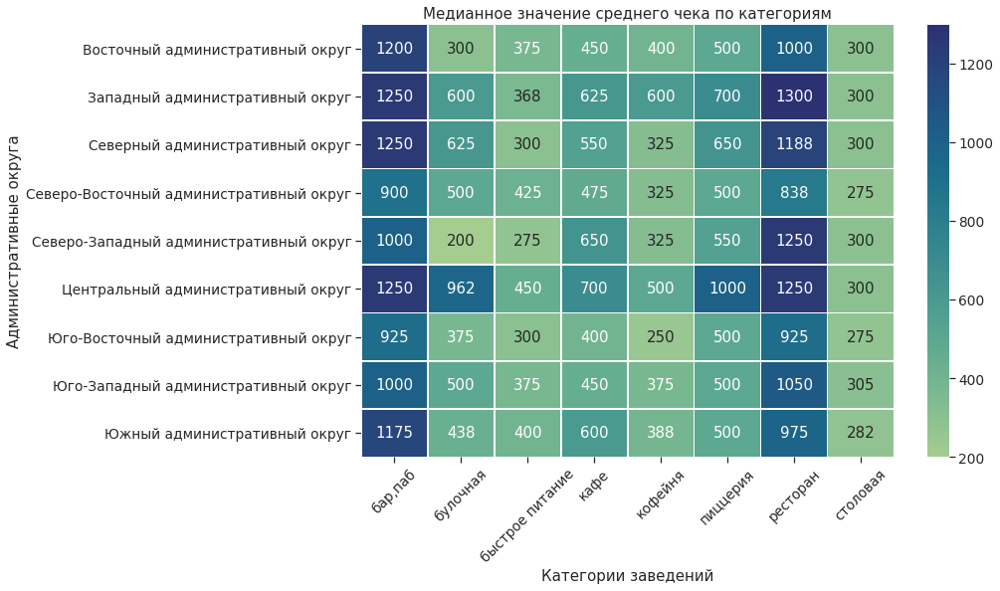

In [68]:
f, ax = plt.subplots(figsize=(12, 8))
sns.set_theme(style="ticks", font_scale=1.25)
sns.heatmap(dist_check_cat[['бар,паб', 'булочная', 'быстрое питание',\
                           'кафе', 'кофейня', 'пиццерия', 'ресторан', 'столовая']], \
            yticklabels=dist_check_cat['district'], annot=True, cmap="crest", linewidth=.5, fmt=".0f")
ax.set(xlabel="Категории заведений", ylabel="Административные округа")
ax.set_title('Медианное значение среднего чека по категориям')
plt.xticks(rotation = 45)
plt.show()

<div class="alert alert-info">
    
Построим тепловую карту для визуализации наших наблюдений.
    Видим, что **бары и рестораны** имеют самые высокие средние чеки, хотя в **булочной** **Центрального административного рйаона** можно оставить больше чем в **кафе** во всех округах.
    
</div>

### Анализ зависимости при удаденности от цента города.

In [69]:
pip install geopy

     |████████████████████████████████| 119 kB 2.5 MB/s eta 0:00:01
     |████████████████████████████████| 40 kB 6.5 MB/s  eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


<div class="alert alert-info">
    
Инсталируем библиотеку `geopy`.
    
</div>

In [70]:
from geopy.distance import great_circle as GC

moscow = (55.751244, 37.618423)
data['remoteness'] = data.apply(lambda row: GC((row['lat'], row['lng']), moscow).km, axis=1)

<div class="alert alert-info">
    
Импортируем `great_circle` для библиотеки `geopy`. Создаем переменную `moscow` с координатами центра города, далее создаем новую колонку `remoteness` в которой на основании данных **широты и долготы** (колонки `lat` и `lng`), вычислим удаленность заведений в километрах от цента города. 
    
</div>

In [71]:
data['remoteness'].describe()

count    8406.000000
mean        8.666542
std         4.831740
min         0.416869
25%         4.244738
50%         8.522857
75%        12.875126
max        20.348697
Name: remoteness, dtype: float64

<div class="alert alert-info">
    
Посмотрим на данные колонки `remoteness`. Видим, что **минимальное** расстояние составляет **400 метров**, в **среднем** заведения удалены на **8.6 км**, а **максимум** показывает заведение которое удалено на **20 км** от центра.  
    
</div>

In [72]:
print(data['remoteness'].corr(data['middle_avg_bill']))

-0.16441635129805035


<div class="alert alert-info">
    
Корреляция значений **среднего чека** к значению **удаленности**, составляет **-0.16**. Таким образом, зависимость отрицательная, но малозначительная.  
    
</div>

In [73]:
print(data['remoteness'].corr(data['rating']))

-0.18543762549107107


<div class="alert alert-info">
    
Корреляция значений **рейтинга** к значению **удаленности**, составляет **-0.18**. Таким образом, зависимость отрицательная, но малозначительная.  
    
</div>

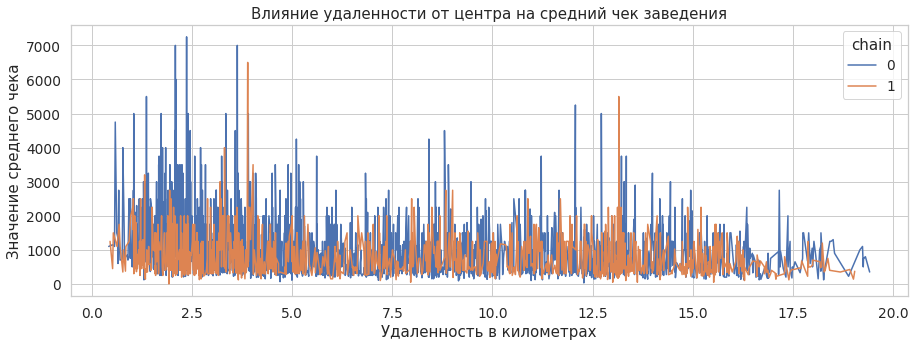

In [74]:
plt.figure(figsize=(15, 5)) 
sns.set_theme(style="ticks", font_scale=1.25)
sns.set_style('whitegrid')
ax = sns.lineplot(x='remoteness', y='middle_avg_bill', hue='chain', data=data[data['middle_avg_bill'] < 8000])
ax.set_title('Влияние удаленности от центра на средний чек заведения')
ax.set_xlabel('Удаленность в километрах')
ax.set_ylabel('Значение среднего чека')

plt.show()

<div class="alert alert-info">
    
Построим график зависимости **среднего чека** на **удаленность** от цента города, дополним график параметром отношения к **сетевому заведению**. Пусть и не значительно, но мы можем наблюдать как цена снижается, уже после **5** километра выбросов меньше. Так же можем наблюдать, что **средний чек** в **сетевых** заведениях немного меньше чем в **не сетевых**.
    
</div>

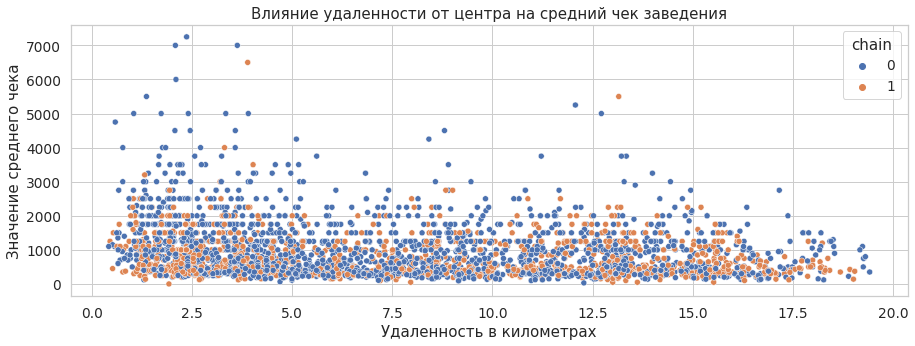

In [75]:
plt.figure(figsize=(15, 5))
sns.set_theme(style="ticks", font_scale=1.25)
sns.set_style('whitegrid')
ax = sns.scatterplot(x='remoteness', y='middle_avg_bill', hue='chain', data=data[data['middle_avg_bill'] < 8000])
ax.set_title('Влияние удаленности от центра на средний чек заведения')
ax.set_xlabel('Удаленность в километрах')
ax.set_ylabel('Значение среднего чека')
plt.show()

<div class="alert alert-info">
    
Посмотрим теже данные, но уже на графике рассеивания.  
    
</div>

### Анализ зависимости различных факторов.

In [76]:
data_pair = data[['category','district','rating','price','middle_avg_bill','middle_coffee_cup','seats','is_24/7','remoteness','chain']]
data_pair.head(2)

,category,district,rating,price,middle_avg_bill,middle_coffee_cup,seats,is_24/7,remoteness,chain
0,кафе,Северный административный округ,5.0,NaN,NaN,NaN,NaN,False,16.620457,0
1,ресторан,Северный административный округ,4.5,выше среднего,1550.0,NaN,4.0,False,16.182124,0


<div class="alert alert-info">
    
Присвоим переменной `data_pair` значения колонок `category`, `district`, `rating`, `price`, `middle_avg_bill`, `middle_coffee_cup`, `seats`, `is_24/7`, `remoteness`, `chain`. Этиданные нам пригодятся для общего анализа зависимостей.
    
</div>

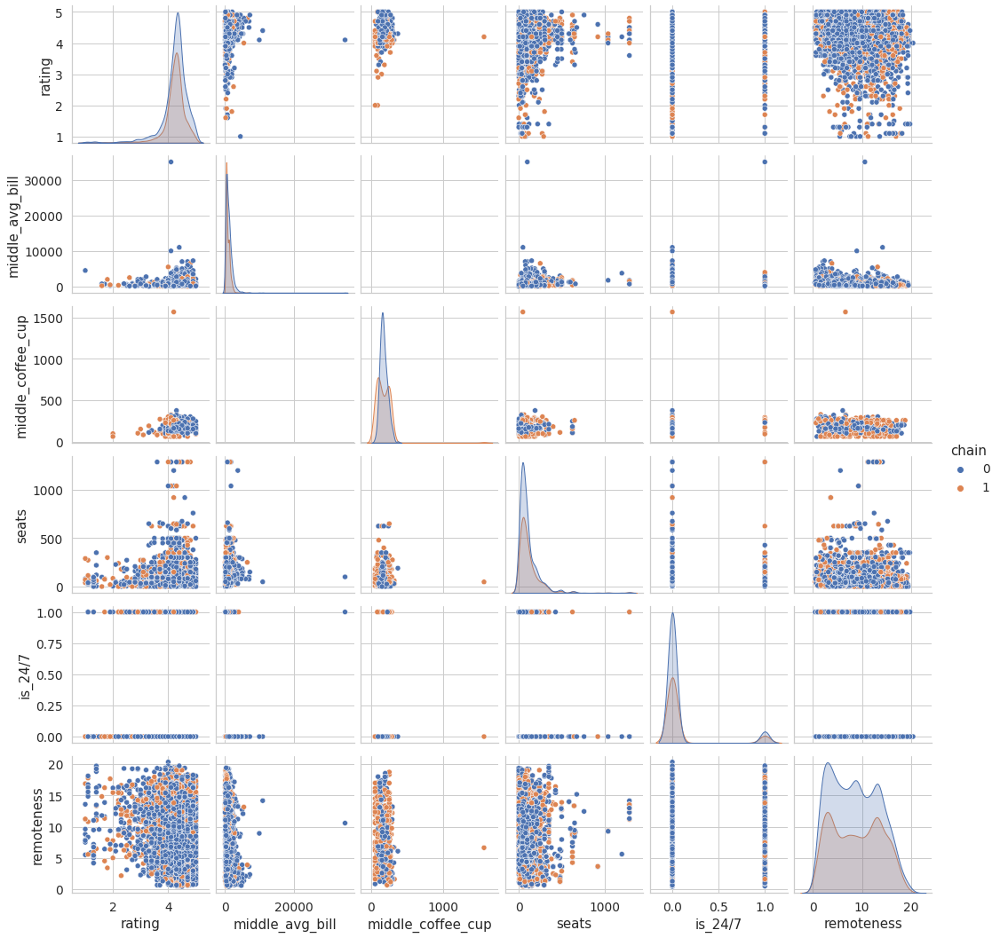

In [77]:
sns.pairplot(data_pair, hue='chain')
plt.show()


<div class="alert alert-info">
    
Построим график зависимостей по отношению к различным категориям. Явных корреляций не наблюдаем.
    
</div>

In [78]:
print(data['remoteness'].corr(data['chain']))

0.038091175781800005


<div class="alert alert-info">
    
Корреляция значений **удаленности** к значению **сетевого статуса**, составляет **0.03**. Таким образом получаем, отсутствие зависимости.
    
</div>

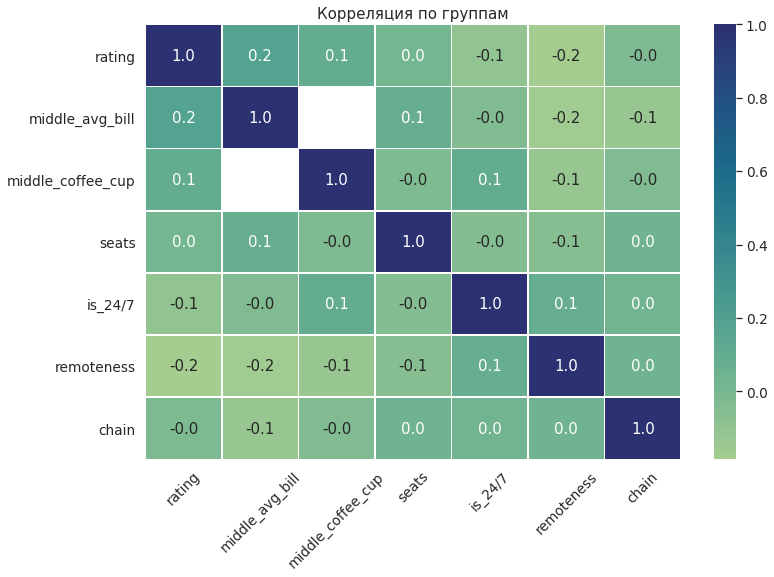

In [79]:
f, ax = plt.subplots(figsize=(12, 8))
sns.set_theme(style="ticks", font_scale=1.25)
sns.heatmap(data_pair.corr(), annot=True, cmap="crest", linewidth=.5, fmt=".1f")
plt.xticks(rotation = 45)
plt.title('Корреляция по группам')
plt.show()

<div class="alert alert-info">
    
Построим тепловую карту корреляции. Можем наблюдать, что **признаки** как прямой, так и отрицательной **зависимости**, **отсутствуют**.
    
</div>

## Детализируем исследование: открытие кофейни

### Анализ кофеен в датасете. В каких районах их больше всего, каковы особенности их расположения?

In [80]:
data_cofe = data[data['category']=='кофейня']
data_cofe.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7,cappuccino,remoteness
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False,капучино,16.602655
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False,нет данных,17.263054
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False,нет данных,16.340467
46,CofeFest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False,нет данных,16.329042
52,Cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False,нет данных,16.606450


<div class="alert alert-info">
    
Отсортируем датафрейм по категории **кофейня** 
    
</div>

In [81]:
data_cofe['category'].count()

1413

<div class="alert alert-info">
    
Всего в датафрейме представлены данные по **1413** заведениям в данной категории. 
    
</div>

In [82]:
data_dist_cofe = data_cofe.pivot_table(index='district', values='category', aggfunc='count')
data_dist_cofe = data_dist_cofe.reset_index()
data_dist_cofe = data_dist_cofe.sort_values(by = 'category', ascending = False)
data_dist_cofe.style.background_gradient('coolwarm')

,district,category
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


<div class="alert alert-info">
    
Составим сводную таблицу. Сгруппируем данные по округам и посчитаем число **кофейн** в каждом, далее отсортируем по убыванию. 
В **Центральном административном округе** кофейн в **2 раза больше** чем в остальных районах **(428)**. На втором месте **Северный административный округ** с показателями в **193** заведения, на третьем месте **Северо-Восточный административный округ** с **159** заведениями. **Северо-Западный административный округ** на последнем месте, всего **62** кофейни.
    
</div>

In [83]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cofe.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-info">
    
Отобразим все **кофейни** на карте.
    
</div>

### Анализ круглосуточных кофейн.

In [84]:
data_cofe.groupby('is_24/7')['is_24/7'].count()

is_24/7
False    1354
True       59
Name: is_24/7, dtype: int64

<div class="alert alert-info">
    
В датафрейме есть данные о времени работы для **1413** заведений. **59** из них работают **круглосуточно**.
    
</div>

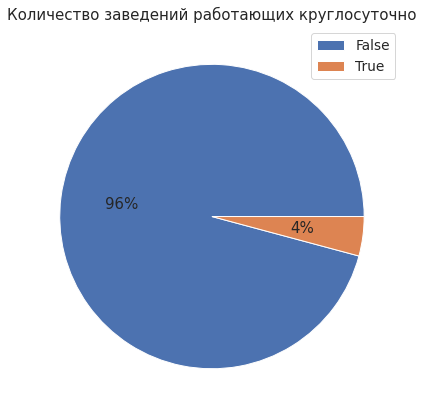

In [85]:
sns.set_theme(style="ticks", font_scale=1.25)
all_time = data_cofe.groupby('is_24/7')['is_24/7'].agg('count')
all_time.plot(kind='pie', labels=None, label='', autopct='%1.0f%%',\
             legend=True, figsize=(7, 7), title='Количество заведений работающих круглосуточно')
plt.show()

<div class="alert alert-info">
    
Визуализируем распределение заведений по тем, что **работают круглосуточно**. 
    
</div>

In [86]:
data_cofe_all_time = data_cofe[data_cofe['is_24/7'] == True]
data_cofe_all_time.groupby('name')['name'].count().sort_values(ascending = False)

name
Шоколадница           17
Кофемания              8
Wild Bean Cafe         6
Wild Bean              5
Кофе Хауз              3
You&coffee             2
Cofix                  2
Кофе с собой           2
Столица                1
Пирог Хауз             1
Молоко                 1
Лаванда Кофе           1
Кофейня One&Double     1
Cinnabon               1
Кофе On                1
The wild bean cafe     1
One&Double             1
One more, please       1
One Price Coffee       1
One And Double         1
FoodMoscowCoffee       1
Гоголь-Моголь          1
Name: name, dtype: int64

<div class="alert alert-info">
    
Сгруппируем **круглосуточные** заведения на **названию** и отсортируем по убыванию. Таким образом мы можем наблюдать явного лидера **Шоколадница**. 
    
</div>

In [87]:
data_cofe_all_time_pivot = data_cofe_all_time.pivot_table(index='district', \
                    values=['name', 'rating'], aggfunc = {'name': 'count', 'rating': 'mean'})
data_cofe_all_time_pivot = data_cofe_all_time_pivot.reset_index()
data_cofe_all_time_pivot = data_cofe_all_time_pivot.sort_values(by = 'name', ascending = False)
data_cofe_all_time_pivot.style.background_gradient('coolwarm')

,district,name,rating
5,Центральный административный округ,26,4.288462
1,Западный административный округ,9,4.200000
7,Юго-Западный административный округ,7,4.271429
0,Восточный административный округ,5,4.300000
2,Северный административный округ,5,4.220000
3,Северо-Восточный административный округ,3,3.866667
4,Северо-Западный административный округ,2,4.250000
6,Юго-Восточный административный округ,1,2.300000
8,Южный административный округ,1,4.000000


<div class="alert alert-info">
    
Сгруппируем **круглосуточные** заведения по **административному округу** и посчитаем **количество** заведений и их **средний рейтинг**. Отсортируем по количеству. У нас в очередной раз, с явным преимуществом, **ледером** оказывается **Центральный административный округ**. Анти рейтинг тоже на лицо, в **Юго-Восточном административном округе**, рейтинг заведения **2.3**.
    
</div>

In [88]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_cofe_all_time.apply(create_clusters, axis=1)

# выводим карту
m

<div class="alert alert-info">
    
Отобразим все **круглосуточные кофейни** на карте. 
    
</div>

### Какие у кофейн рейтинги? Как они распределяются по районам?

In [89]:
data_dist_cofe_rating = data_cofe.pivot_table(index='district', values='rating', aggfunc='mean')
data_dist_cofe_rating = data_dist_cofe_rating.reset_index()
data_dist_cofe_rating = data_dist_cofe_rating.sort_values(by = 'rating', ascending = False)
data_dist_cofe_rating.style.background_gradient('coolwarm')

,district,rating
5,Центральный административный округ,4.336449
4,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
7,Юго-Западный административный округ,4.283333
0,Восточный административный округ,4.282857
8,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
3,Северо-Восточный административный округ,4.216981
1,Западный административный округ,4.195333


<div class="alert alert-info">
    
Построим сводную таблицу. Сгруппируем по округам и посчитаем средний рейтинг. Далее отсортируем по убыванию. Видим, что **Центральный административный округ** вновь на первом месте с показателем **4.33**, на втором месте **Северо-Западный административный округ** с показателем **4.32**, на третьем месте **Северный административный округ** с показателем **4.29**. А вот **Западный административный округ** оказался на последнем месте с показателем **4.19**.
    
</div>

In [90]:
data_name_cofe_rating = data_cofe.pivot_table(index='name', values='rating', aggfunc= 'mean')
data_name_cofe_rating = data_name_cofe_rating.sort_values(by = 'rating', ascending = False)
data_name_cofe_rating = data_name_cofe_rating.reset_index()
data_name_cofe_rating.style.background_gradient('coolwarm')

,name,rating
0,Coffee Drop,5.000000
1,NoNameCoffee,5.000000
2,Выдра кофе,5.000000
3,Nero Bean Coffee Roastery,5.000000
4,Дайтекофе,5.000000
5,Дворик Невского,5.000000
6,Big Black Cup coffee,5.000000
7,Pique-Nique,5.000000
8,За Думой,5.000000
9,Иду лесом,5.000000


<div class="alert alert-info">
    
Сгруппируем кофейни по названию и посчитаем средний рейтинг. 
- Первые **30** заведений имеют рейтинг**5**, 
- далее с **31** по **765** место имеют рейниен **4**, 
- с **766** по **835** рейтинг **3**, 
- еще **2** заведения имеют рейтинг**2** 
- и всего **одно** заведение **Маракуйя** имеет рейтинг **1.4**.
    
</div>

In [91]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:geo_json = json.load(f)
    
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_dist_cofe_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофейн по районам',
).add_to(m)

# выводим карту
m

<div class="alert alert-info">
    
Построим хороплет с данными **среднего рейтинга**. Видим, что **Центральный административный округ** вновь на первом месте с показателем **4.33**, на втором месте **Северо-Западный административный округ** с показателем **4.32**, на третьем месте **Северный административный округ** с показателем **4.29**. А вот **Западный административный округ** оказался на последнем месте с показателем **4.19**. 
    
</div>

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [92]:
data_cofe['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

<div class="alert alert-info">
    
Посмотрим на данные колонки `middle_coffee_cup` с ценой на **чашку капучино**. Всего данные о стоимости чашки капучино представлены по **521** заведению. **Среднее** значение **175** рублей, **медианное** значение **170** рублей, **минимум** **60** и **максимум** **1568**.
    
</div>

In [93]:
data_cofe['middle_coffee_cup'].sort_values(ascending = False).head(10)

2859    1568.0
5503     375.0
3718     328.0
1769     325.0
5990     320.0
2075     315.0
4657     300.0
3580     300.0
6687     300.0
3095     300.0
Name: middle_coffee_cup, dtype: float64

<div class="alert alert-info">
    
Отсортируем данные по убыванию. Цена в **1568** рублей аномалия.
    
</div>

In [94]:
data_cofe_cap = data_cofe.query('middle_coffee_cup <= 400')

<div class="alert alert-info">
    
Создадим переменную `data_cofe_cap` со сначением чашки капучино не выше **400** рублей.. 
    
</div>

In [95]:
data_cofe_cap_price = data_cofe_cap.pivot_table(index='district', values='middle_coffee_cup', aggfunc= 'median')
data_cofe_cap_price = data_cofe_cap_price.sort_values(by = 'middle_coffee_cup', ascending = False)
data_cofe_cap_price = data_cofe_cap_price.reset_index()
data_cofe_cap_price.style.background_gradient('coolwarm')

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.000000
1,Центральный административный округ,190.000000
2,Западный административный округ,189.000000
3,Северо-Западный административный округ,165.000000
4,Северо-Восточный административный округ,162.500000
5,Северный административный округ,159.000000
6,Южный административный округ,150.000000
7,Юго-Восточный административный округ,147.500000
8,Восточный административный округ,135.000000


<div class="alert alert-info">
    
Группируем данные **цены** на чашку капучино по **административным округам** и считаем **медианное** значение. Далее сортируем по убыванию. Получаем информацию, на первом месте **Юго-Западный административный округ** с ценой за чашку в **198** рублей, на втором месте **Центральный административный округ** с ценой за чашку в **190** рублей, третье место у **Западного административного округа** с ценой за чашку в **189** рублей, а самым бюджетным оказался **Восточный административный округ** с ценой в **135** рублей за чашку капучино. 
    
</div>

In [96]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:geo_json = json.load(f)
    
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_cofe_cap_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек за чашку капучино по районам',
).add_to(m)

# выводим карту
m

<div class="alert alert-info">
    
Построим карту хороплет для визуализации данных о цене на чашку капучино. 
    
</div>

In [97]:
data_cofe_cap.groupby('price')['price'].count()

price
выше среднего      1
низкие            57
средние          210
Name: price, dtype: int64

<div class="alert alert-info">
    
Посмотрим на распределение ценовой категории. 
    
</div>

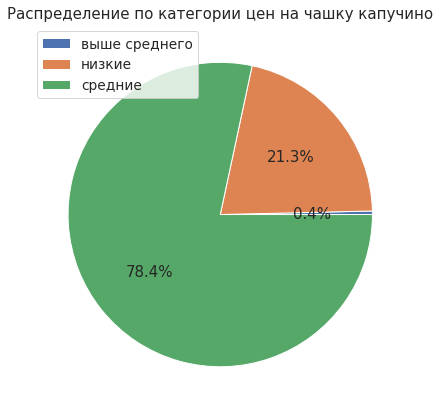

In [98]:
sns.set_theme(style="ticks", font_scale=1.25)
price_cap = data_cofe_cap.groupby('price')['price'].agg('count')
price_cap.plot(kind='pie', labels=None, label='', autopct='%1.1f%%',\
             legend=True, figsize=(7, 7), title='Распределение по категории цен на чашку капучино')
plt.show()

<div class="alert alert-info">
    
Построим для визуализации график распределение по ценовым категориям. К **средней** ценовой категории относят себя **78%** заведений, а к **низкой** **21%**. 
    
</div>

In [99]:
data_cofe_cap_price_st = data_cofe_cap.pivot_table(index='street', values='middle_coffee_cup', aggfunc= 'median')
data_cofe_cap_price_st = data_cofe_cap_price_st.sort_values(by = 'middle_coffee_cup', ascending = False)
data_cofe_cap_price_st = data_cofe_cap_price_st.reset_index()
data_cofe_cap_price_st.style.background_gradient('coolwarm')

,street,middle_coffee_cup
0,Большая Никитская улица,328.000000
1,3-я Фрунзенская улица,320.000000
2,Богословский переулок,300.000000
3,Большая Сухаревская площадь,300.000000
4,улица Гарибальди,291.000000
5,3-й Крутицкий переулок,291.000000
6,площадь Победы,291.000000
7,Милютинский переулок,290.000000
8,Енисейская улица,287.000000
9,Стремянный переулок,285.000000


<div class="alert alert-info">
    
Сгруппируем данные **цены** на **чашку капучино** по **улицам** и посчитаем **медианное** значение. Далее отсортируем по убыванию и получим **рейтинг** мест с **самым дорогим капучино**. На **первом** месте **Большая Никитская** с ценой за чашку в **328** рублей, на **втором** месте **3-я Фрунзенская улица** с ценой в **320** рублей, на **третьем и четвертом** месте **Богословский переулок и Большая Сухаревская площадь** с ценой за чашку в **300** рублей. **Последние 12** мест занимают улицы на которых можно купить чашку капучино за **60** рублей.
    
</div>

## Общий вывод

<div style="border:solid Red 2px; padding: 10px">
<div class="alert alert-info">
    
 <font color='red'>**Исследование заведений общественного питания в Москве.**</font> 
 
 По задаче инвесторов из фонда **«Shut Up and Take My Money»** анализируем данные заведений Московского общественного питания. 
Нам доступен датасет с заведениями общественного питания **Москвы**, составленный на основе данных сервисов **Яндекс Карты** и **Яндекс Бизнес** на лето **2022** года. Информация, размещённая в сервисе **Яндекс Бизнес**, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
    
**1)**	На первом этапе мы загружаем все необходимые библиотеки которые могут понадобится в процессе выполнения проекта.  А именно: `pandas` (для работы с данными), `matplotlib`, `seaborn` и `plotly` (для будущих графиков),  `display` для вывода таблиц. Далее создаем переменную  `data` и выводим первые пять строк датафрейма. Данные распределены по **14** колонкам:
- `name` — *название заведения*
- `address` — *адрес заведения* 
- `category` — *категория заведения*
- `hours` — *информация о днях и часах работы*
- `lat` — *широта географической точки, в которой находится заведение*
- `lng` — *долгота географической точки, в которой находится заведение*
- `rating` — *рейтинг заведения по оценкам пользователей в Яндекс Картах*
- `price` — *категория цен в заведении*
- `avg_bill` — *строка, которая хранит среднюю стоимость заказа в виде диапазона*
- `middle_avg_bill` — *число с оценкой среднего чека,*
- `middle_coffee_cup` — *число с оценкой одной чашки капучино*
- `chain` — *идентификатор которое показывает, является ли заведение сетевым*
- `district` — *административный район, в котором находится заведение*
- `seats` — *количество посадочных мест*
Всего **8406** строк.
    
**2)**	На этапе предобработки данных, проверили на наличие пропусков. В колонке `hours` с указанием времени работы есть **536** пропусков, это около **6%** всех данных, заменим их на значение **нет данных**. В колонках `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats` пропусков слишком много, поэтому оставим как есть.
    
Проверка на **дубликаты**, таковых **не выявила**.
    
Для удобства дальнейшего анализа, создадим новую колонку `street`, в нее войдут только название **улицы**. 
    
Дополнительно создали новую колонку `is_24/7` в которой отразим заведения работающие **ежедневно и круглосуточно** и все остальные.
    
**3)**	Анализ данных.
В данных представлены заведения по **8** категориям **(кафе, ресторан, кофейня, пиццерия, бар, быстрое питание, булочная и столовая)**.  При сортировки получили данные по количеству заведений в каждой категории.
    
- **кафе 2378** заведений
- **ресторан 2043** заведений
- **кофейня 1413** заведений
- **бар 765** заведений
- **пиццерия 633** заведений
- **быстрое питание 603** заведений
- **столовая 315** заведений
- **булочная 256** заведений

**4)**	Исследуем данные по количеству **посадочных мест**, они представлены только по **4795** заведениям. **Максимальное** значение **1288** мест, **среднее** **108**, а **медианное** **75**. Это означает, что большое максимальное значение перетягивает среднее значение в большую сторону. Очень интересно, максимальное значение в **1288** мест указано в 11 заведениях. Примечательно, что заведения разных категорий,  есть как **сетевые**, так и **не сетевые**, но все располагаются на одной улице **проспект Вернадского**. Исходя из этих данных, можем считать значения **выше 800**, аномальными и в дальнейшем исключить их из выборки.
    После группировки и сортировки получаем данные о **медианном** значении **посадочных мест** по **категориям**:
    
- **рестораны 86** посадочных мест или **16%** от общего объема
- **бары 82,5** посадочных мест или **15%** от общего объема
- **кофейни 80** посадочных мест или **14%** от общего объема
- **столовая 75,5** посадочных мест или **14%** от общего объема
- **быстрое питание 65** посадочных мест или **12%** от общего объема
- **кафе 60** посадочных мест или **11%** от общего объема
- **пиццерия 55** посадочных мест или **10%** от общего объема
- **булочная 50** посадочных мест или **9%** от общего объема
    
**5)**	Исследуем данные соотношения **сетевых** и **не сетевых** заведений. Всего в датафрейме представлено **5201** заведений **не сетевых (62%)** и **3205** заведений **сетевых (38%)**.
    
**6)**	Исследуем категории на предмет принадлежности к сетевым заведениям.  Видим,  что такие категории как: **кафе**, **ресторан**, **бар**, **быстрое питание** и **столовая** чаще не относятся к сетевым, а вот **кофейня**, **пиццерия** и **булочная** чаще имеют принадлежность к **сетевому бизнесу**. Например **булочная** имеет отношение **158%**, а **пиццерия** **108%**, **кофейня** **103%**, а **кафе** **48%** и **ресторан** **55%**.
    
**7)**	Исследуем топ 15 сетевых заведений. После группировки и сортировки получаем список:
    
- **Кафе 189** заведений
- **Шоколадница 120** заведений
- **Домино'с Пицца 76** заведений
- **Додо Пицца 74** заведения
- **One Price Coffee 71** заведение
- **Яндекс Лавка 69** заведений
-**Cofix 65** заведений
- **Prime 50** заведений
- **Хинкальная 44** заведения
- **Шаурма 43** заведения
- **КОФЕПОРТ 42** заведения
- **Кулинарная лавка братьев Караваевых 39** заведений
- **Теремок 38** заведений
- **Чайхана 37** заведений
- **Ресторан 34** заведения
    
Над некоторыми названиями явно не трудились при создании. Далее мы узнали, какие категории есть у нашего **топ 15 заведений**. И выяснили, что у **8** из **15** сетей, заведения представлены в различных категориях. Например, **Кафе** представлено в **7** категориях, **Хинкальная** в **5**, **Чайхана** в **3**, **Шаурма** в **3**, **Шоколадница** в **2**.

**8)**	Исследуем распределение различных **категорий** по **административным округам**. Всего таких округов **9**. После группировки и сортировки видим, что основная масса заведений располагается в **Центральном административном округе**, на него приходятся все первые места категорий при сортировки. Если не брать данные лидера, то видим, что **булочные** чаще располагаются в **Западном и Северном административном округах**, а **быстрое питание** развито в **Южном, Северо-Восточном и Восточном административном округе**. 
    Распределение по остальным не так сильно выражено. А пиковое значение в **670** заведений, показывают рестораны в **Центральном административном округе**.
    
**9)**	Исследуем распределение **средних рейтингов** в зависимости от **категорий** заведений. Распределение показывает, **среднее** значение на уровне **4.22**, **медианное** значение **4.3**, **первый перцентиль** на уровне **4.1** (в основном ставят хорошие рейтинги). Самый высокий средний рейтинг у **баров**, далее идет группа из **4** категорий **(пиццерия, ресторан, кофейня и булочная)**, на удивление **столовая** опережает **кафе** и замыкает список **быстрое питание**.
    
**10)**	Для анализа **среднего рейтинга** заведений в зависимости от **района** Москвы, построим карту хороплет со значениями **среднего** рейтинга. Видим как явно выделяется **Центральный административный округ**, далее **Северный и Северо-Западный административные округа**, хуже всего обстоят дела в **Юго-Восточном административном округе**.
    
**11)**	С помощью инструментов **folium** отображаем все заведения датафрейма на карте в виде **кластеров**. Видим как группируются заведения в центре Москвы.
    
**12)**	По аналогии с заведениями, составили рейтинг **топ 15 улиц** Москвы по количеству **заведений**.
    
– **проспект Мира 184** заведения
– **Профсоюзная улица 122** заведения
– **проспект Вернадского 108** заведений
– **Ленинский проспект 107** заведений
– **Ленинградский проспект 95** заведений
– **Дмитровское шоссе 88** заведений
– **Каширское шоссе 77** заведений
– **Варшавское шоссе 76** заведений
– **Ленинградское шоссе 70** заведений
– **МКАД 65** заведений
– **Люблинская улица 60** заведений
– **улица Вавилова 55** заведений
– **Кутузовский проспект 54** заведения
– **улица Миклухо-Маклая 49** заведений
– **Пятницкая улица 48** заведений
    
Из открытых источников мы знаем, что протяженность **проспекта Мира** составляет **9 км**, таким образом можно посчитать **плотность** заведений, она составит **1 заведение на каждые 50 метров проспекта**.
    
Далее составили тепловую карту и столбчатую диаграмму для визуализации данных. Из явных лидеров можно отметить **Кафе** на **проспекте Мира и МКАД**, а так же **ресторан** на **проспекте Мира**.  На **Варшавском и Каширском шоссе**, а так же на **МКАД и Люблинской улице** отсутствуют булочные. На **МКАД** нет **пиццерий**, **столовая** отсутствует на **улицах Пятницкая, Вавилова и Миклухо-Маклая**.
    
**13)**	Исследуем **улицы** на которых расположено только **одно заведение**. Таких улиц оказалось **458**. Изучив типизацию улиц, мы узнали, что **107** заведений расположены в **переулках**, еще **48** в **проездах**, так же присутствуют **набережные, тупики, шоссе, площади и т.д.**. Для визуализации, отобразили все заведения на карте.
    Далее изучили представленность в категориях:
    
– **кафе 160** заведений
    
– **ресторан 93** заведения
    
– **кофейня 84** заведения
    
– **бар 39** заведений
    
– **столовая 36** заведений
    
– **быстрое питание 23** заведения
    
– **пиццерия 15** заведений
    
– **булочная 8** заведений
    
    
Чаще всего располагается **кафе**, а **булочные** в меньшей степени.
    
**14)**	Изучили показатели **среднего чека**. Всего данные известны по **3149** заведениям, **среднее** значение **958**, **медиана** **750**. На **среднее** значение сильно влияет **максимум**, который показывает **35000**, с большой долей вероятности, это банкетный зал, поэтому чек завышен и был исключен из выборки. 
    Сгруппированные данные по округам показывают максимальные значения **1000** в  **Центральном и Западном округах**, а остальные **7 округов**, показывают значения в среднем на **40%  ниже**. 
    Для визуализации, отобразили наши наблюдения на карте хороплет, а так же на тепловой карте с распределением категорий по округам. Из тепловой карты делаем вывод, что **бары и рестораны** имеют самые **высокие средние чеки**, хотя в **булочной** **Центрального административного района** можно оставить больше чем в **кафе** во всех округах,  а  вот**столовые** самые бюджетные.
    
**15)**	Изучили зависимости при **удаленности** от цента города. Для этого добавили новую колонку, в которой, высчитали на какое расстояние в километрах удалено заведение от цента города. 
    Видим, что **минимальное** расстояние составляет **400 метров**, в **среднем** заведения удалены на **8.6 км**, а **максимум** показывает заведение которое удалено на **20 км** от центра. 
    Корреляция значений **среднего чека** к значению **удаленности**, составляет **-0.16**. Таким образом, зависимость отрицательная, но малозначительная. 
    Корреляция значений **рейтинга** к значению **удаленности**, составляет **-0.18**. Таким образом, зависимость отрицательная, но малозначительная. 
    Дополнительно построили график влияния **удаленности** на **средний чек**, Пусть и не значительно, но мы можем наблюдать как цена снижается, уже после **5** километра выбросов меньше. Так же можем наблюдать, что **средний чек** в **сетевых** заведениях немного меньше чем в **не сетевых**.
    
**16)**	Дополнительно изучили зависимости различных факторов, для этого построили сводный `pairplot`, но к сожалению явных зависимостей не выявили, а в качестве подтверждения, построили тепловую карту корреляции различных факторов. Полученные значения не превышают значений **0.2**. 
    К примеру корреляция значений **удаленности** к значению **сетевого статуса**, составляет **0.03**. Таким образом получаем, отсутствие зависимости.
    
**17)**	Дополнительно произвели изыскания по категории **кофейня**, это современный и быстрорастущий тренд. Всего в датафрейме представлены **1413** заведений данной **категории**. После группировки и сортировки мы определили, что **Центральном административном округе** кофейн в **2 раза больше** чем в остальных районах **(428)**. На втором месте **Северный административный округ** с показателями в **193** заведения, на третьем месте **Северо-Восточный административный округ** с **159** заведениями. **Северо-Западный административный округ** на последнем месте, всего **62** кофейни. 
    Для наглядной визуализации, отобразили все заведения на карте.
    
**18)**	При изучении времени работы, мы определили, что всего **4%** кофейн работают **круглосуточно**, а это **59** заведений.
    Визуализировали наблюдение графиком. 
    Изучая какие заведения работают **круглосуточно**, выявили лидера, это сеть **Шоколадница** с **17** заведениями, на втором месте **Кофемания** с  **8** заведениями, остальные представлены не так хорошо. 
    После группировки по **округам** и сортировки по **среднему рейтингу**, выявили округа лидеры. У нас в очередной раз, с явным преимуществом, **лидером** оказывается **Центральный административный округ**. 
    Анти рейтинг тоже на лицо, в **Юго-Восточном административном округе**, рейтинг заведения **2.3**. Для наглядности, визуализировали все на карте.
    
**19)**	Изучили рейтинги в категории **кофейня**.  Сгруппировав по **округам** и посчитав **среднее** значение, выявили,  что **Центральный административный округ** вновь на первом месте с показателем **4.33**, на втором месте **Северо-Западный административный округ** с показателем **4.32**, на третьем месте **Северный административный округ** с показателем **4.29**. А вот **Западный административный округ** оказался на последнем месте с показателем **4.19**.  
    Визуализировали эти наблюдения на карте хороплет.  
    А сгруппировав рейтинги по заведениям, определили:
    
- Первые **30** заведений имеют рейтинг**5**, 
- далее с **31** по **765** место имеют рейтинг **4**, 
- с **766** по **835** рейтинг **3**, 
- еще **2** заведения имеют рейтинг**2** 
- и всего **одно** заведение **Маракуйя** имеет рейтинг **1.4**.
    
**20)**	Изучили стоимость чашки капучино. 
    Всего данные о стоимости чашки капучино представлены по **521** заведению. **Среднее** значение **175** рублей, **медианное** значение **170** рублей, **минимум** **60** и **максимум** **1568**, это значение является аномалией и из дальнейшей выборки будет исключено. 
    После группировки по округам и сортировки по цене, мы получаем рейтинг **самых дорогих округов** по **цене на чашку капучино**.  На первом месте **Юго-Западный административный округ** с ценой за чашку в **198** рублей, на втором месте **Центральный административный округ** с ценой за чашку в **190** рублей, третье место у **Западного административного округа** с ценой за чашку в **189** рублей, а самым бюджетным оказался **Восточный административный округ** с ценой в **135** рублей за чашку капучино.
    Визуализировали наши наблюдения на карте хороплет. 
    Дополнительно изучили к каким ценовым категориям принадлежат эти заведения. К **средней** ценовой категории относят себя **78%** заведений, а к **низкой** **21%**. 
    Визуализировали наблюдения графиком. 
    Сгруппировали данные **цены** на **чашку капучино** по **улицам** и посчитали **медианное** значение, отсортировали по убыванию и получим **рейтинг** мест с **самым дорогим капучино**. На **первом** месте **Большая Никитская** с ценой за чашку в **328** рублей, на **втором** месте **3-я Фрунзенская улица** с ценой в **320** рублей, на **третьем и четвертом** месте **Богословский переулок и Большая Сухаревская площадь** с ценой за чашку в **300** рублей. **Последние 12** мест занимают улицы на которых можно купить чашку капучино за **60** рублей.\
    Резюмируя, можно отметить, что рынок **общественного питания** очень разнообразен даже в рамках одной **категории**. К примеру, кофейни могут быть небольшими, располагаться на 10м2 и торговать на вынос, имея в меню дополнение к кофе небольшой ассортимент выпечки, а может быть полноценное большое заведение с большим ассортиментом блюд и количеством посадочных мест не менее 80.\
    Будущим инвесторам, в первую очередь необходимо ответить на вопрос о бюджете будущего заведения и его концепции. Можно рассматривать франшизы или идти по собственному пути.\
    Дополнительно не помешает **анализ пешего и автомобильного трафика** в том районе, в котором хотели бы развиваться. Так же нужен детальный **анализ всех конкурентов** в радиусе **5-10** км.\
    Что касается цены на чашку, то она будет зависеть не от желания владельца заведения, а от возможности того или иного района, на цену будут влиять конкуренты, проходимость, цена закупки, использование оборудования (свое или арендное), наличие и качество персонала.
    
Если вдаваться в детали, то данный проект не выдержит временные рамки, отведенные на его подготовку в рамках обучения.  Поэтому вынужден остановиться и отправить проект на проверку.


   
    
</div>